## LoRA (Low Rank Adapation)

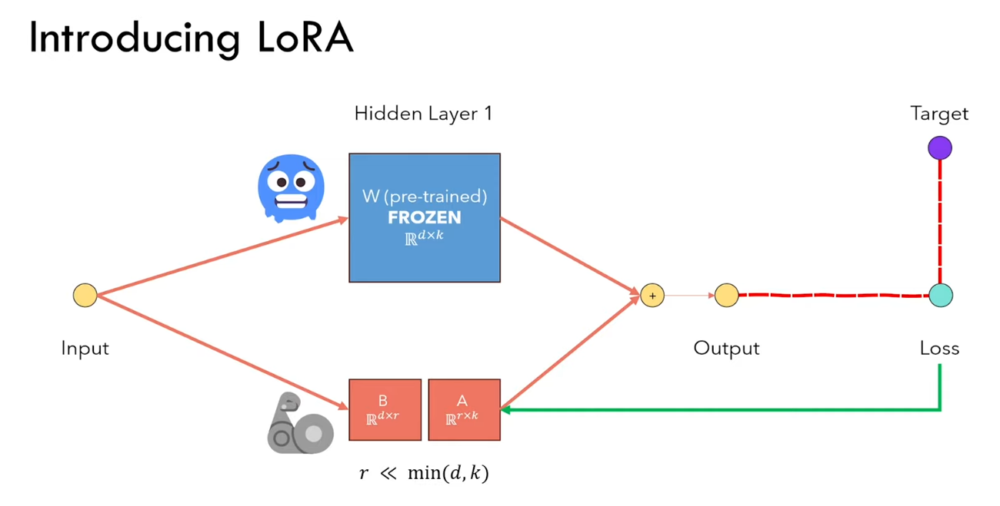

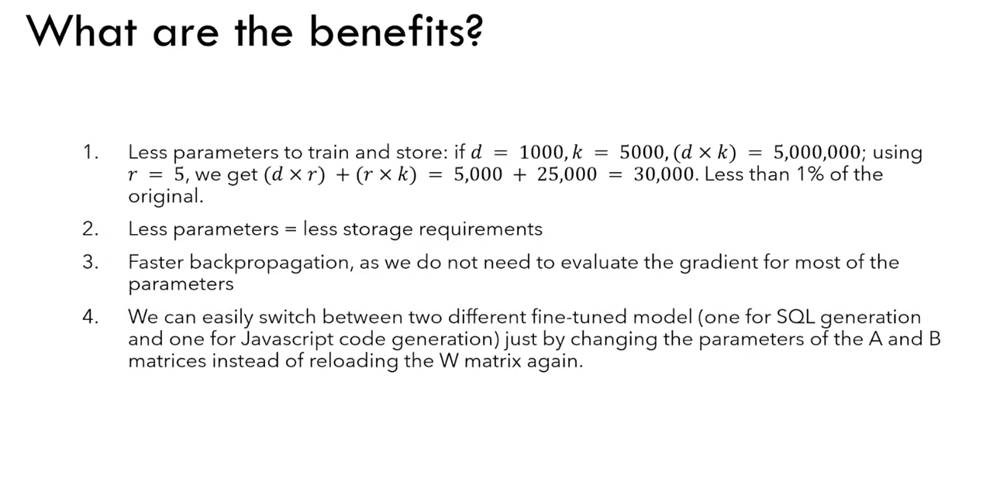

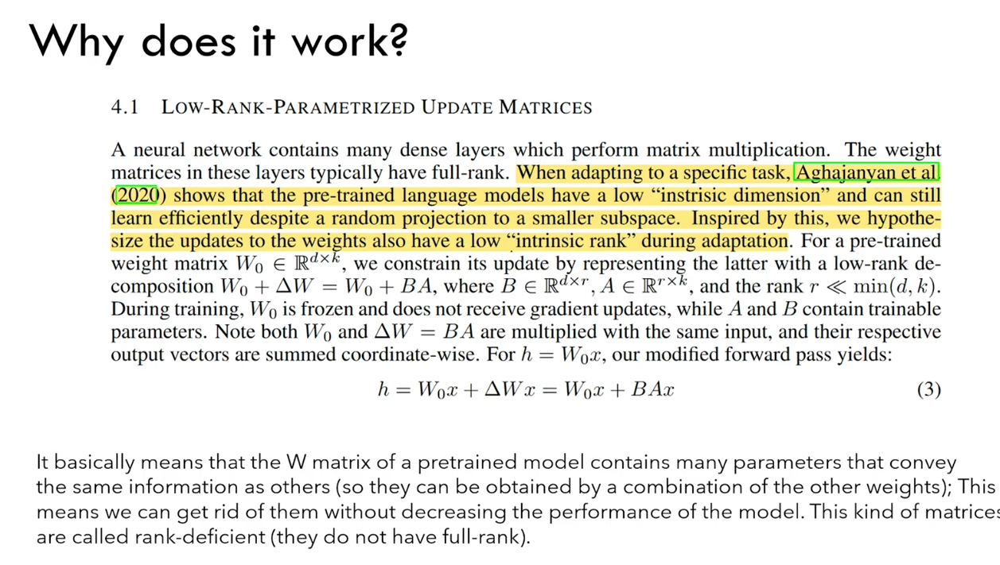

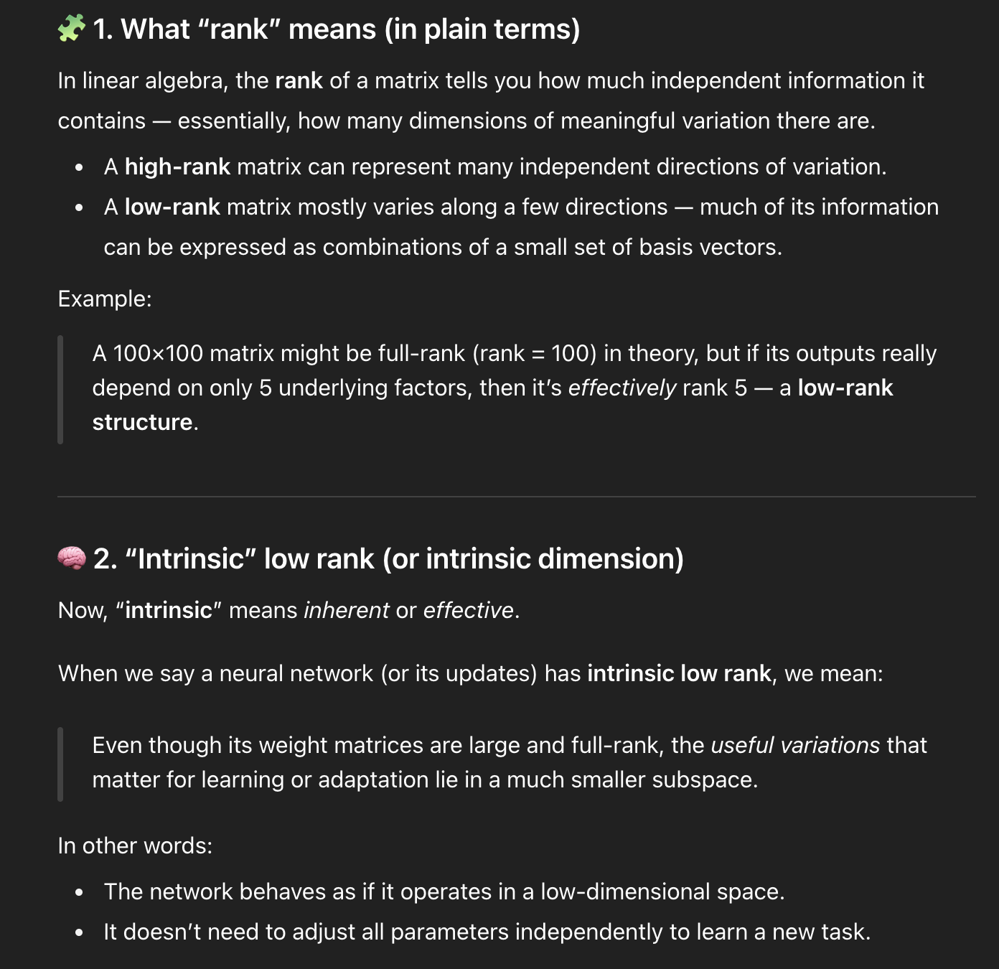

---

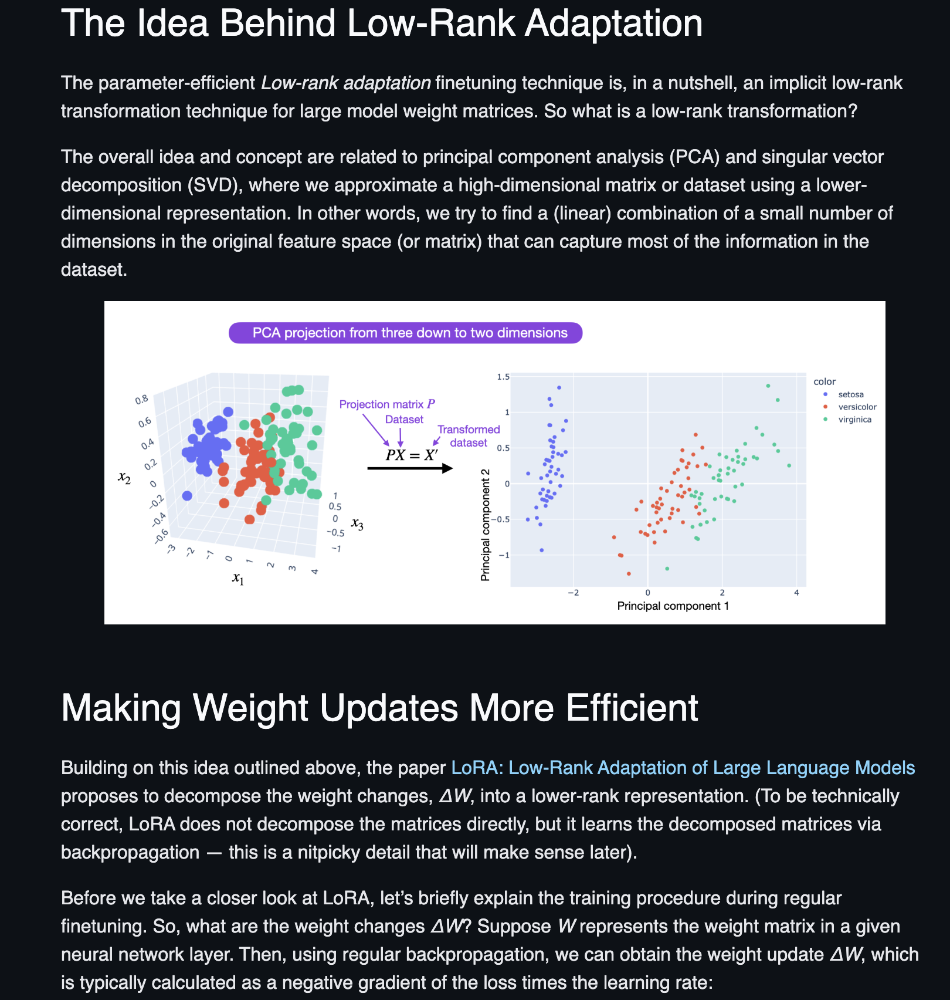

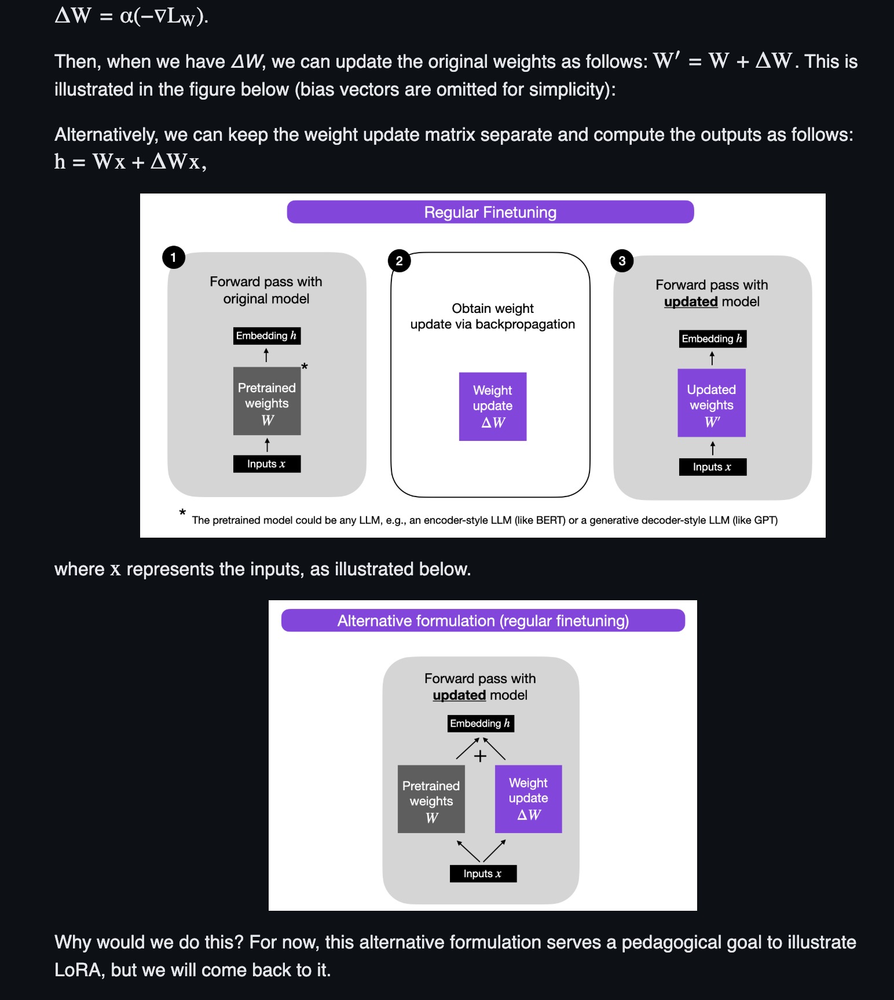

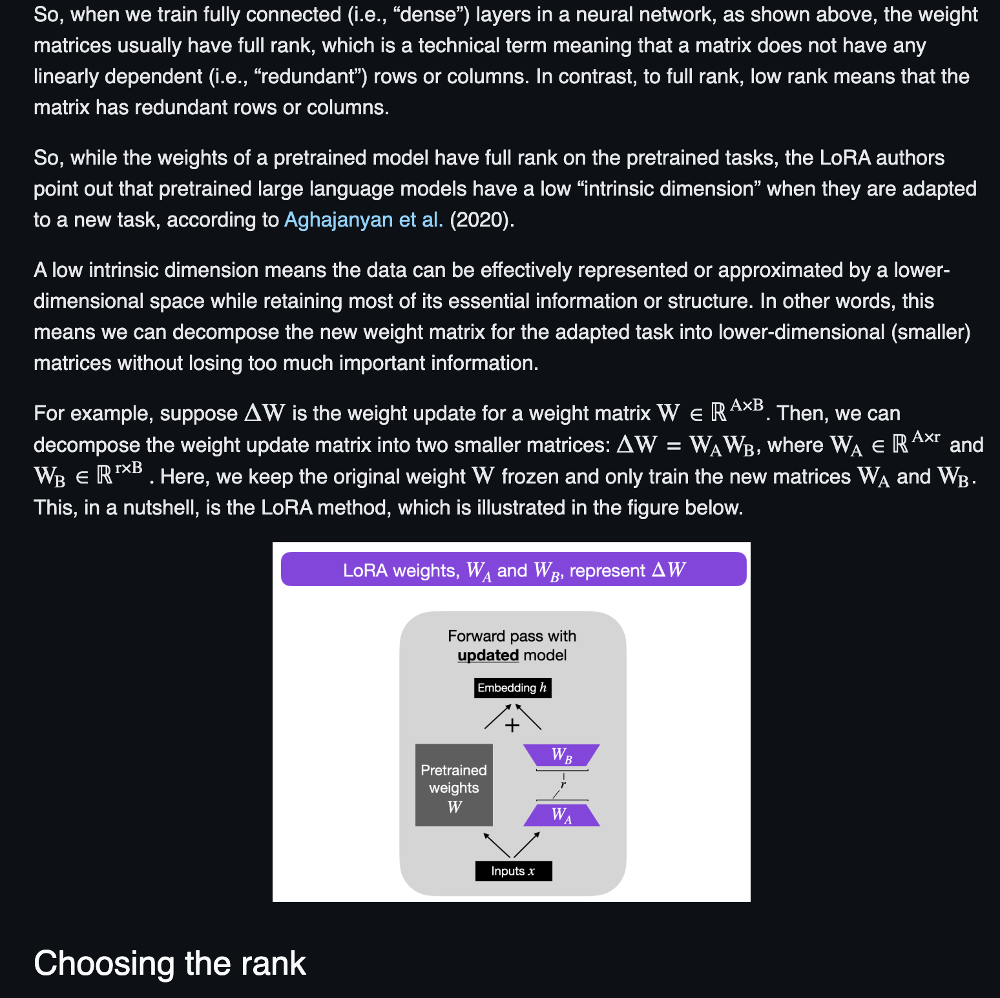

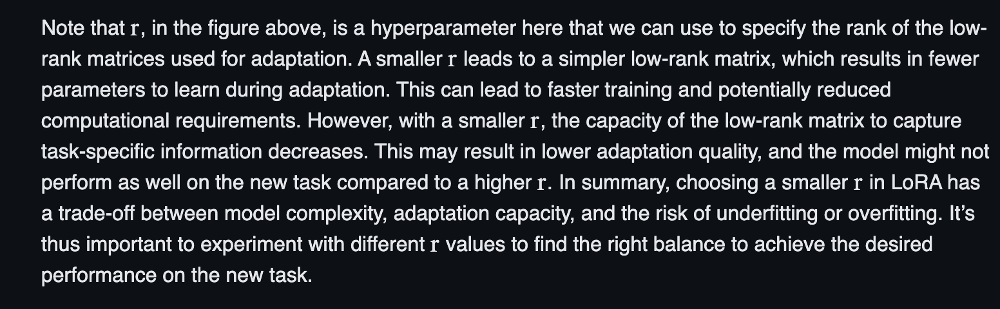

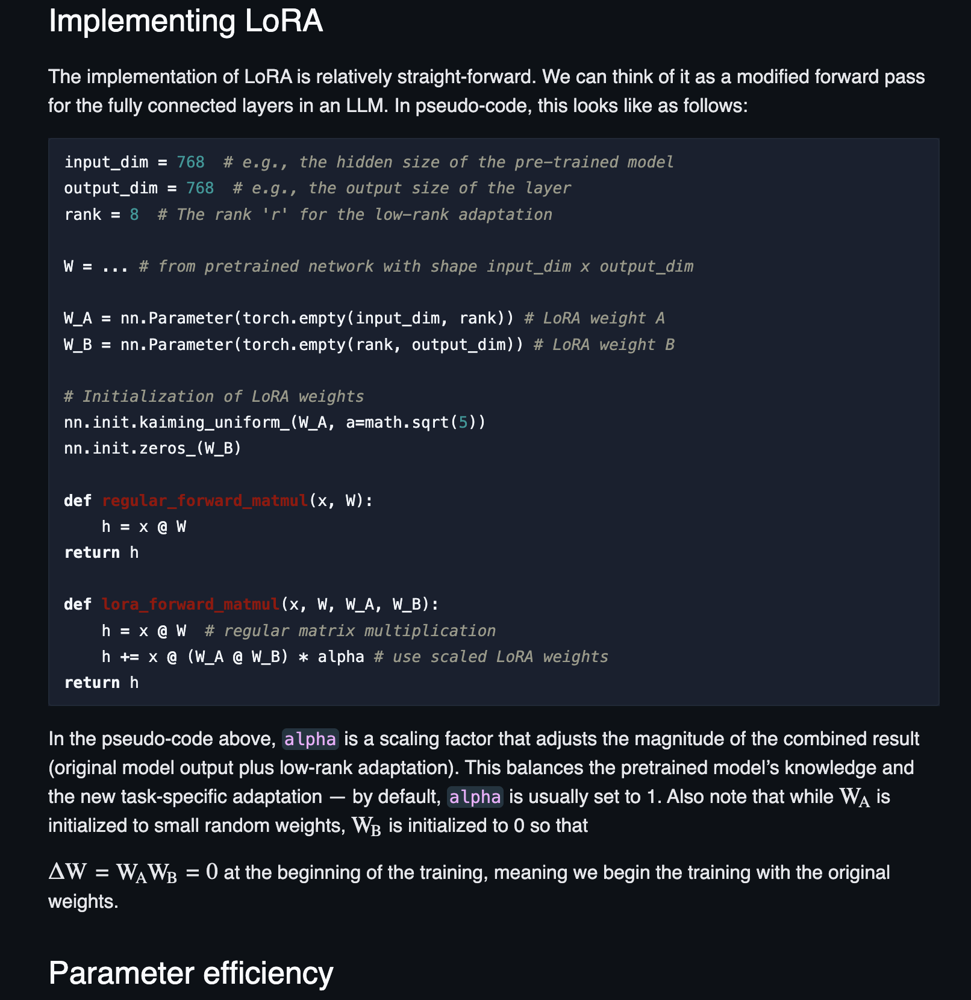

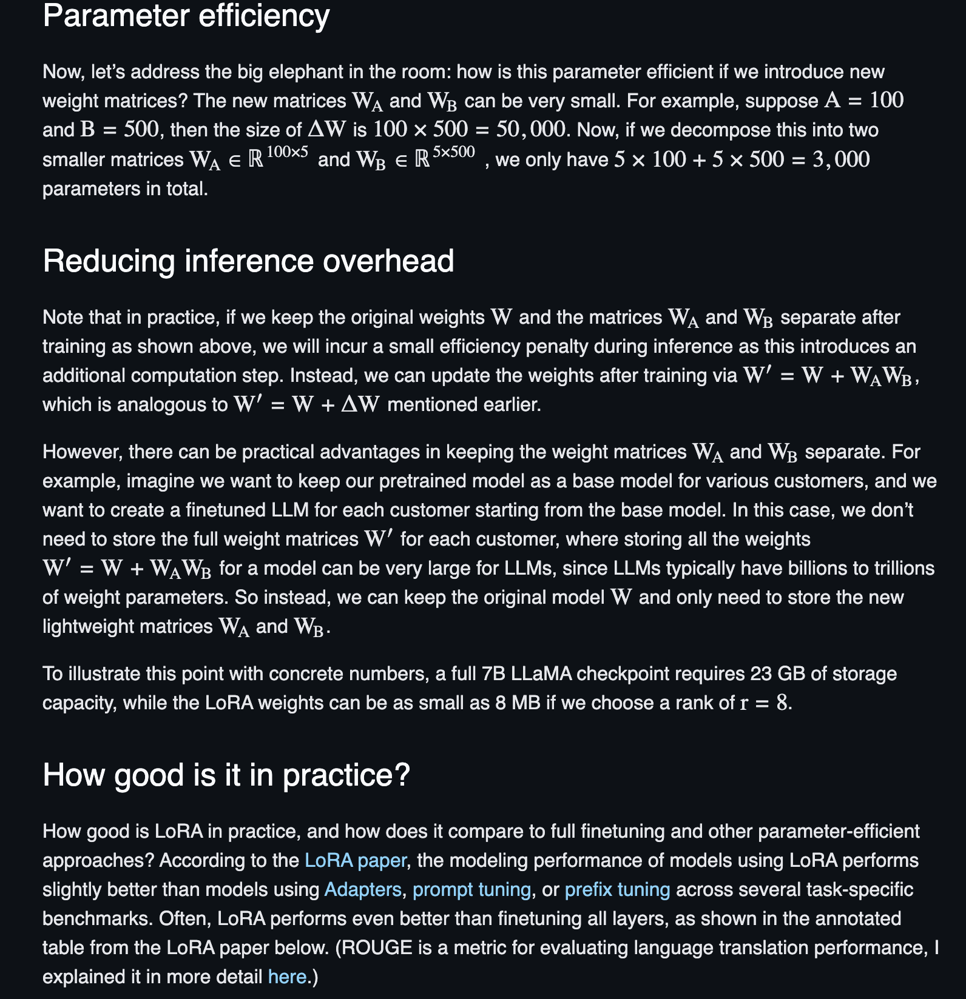



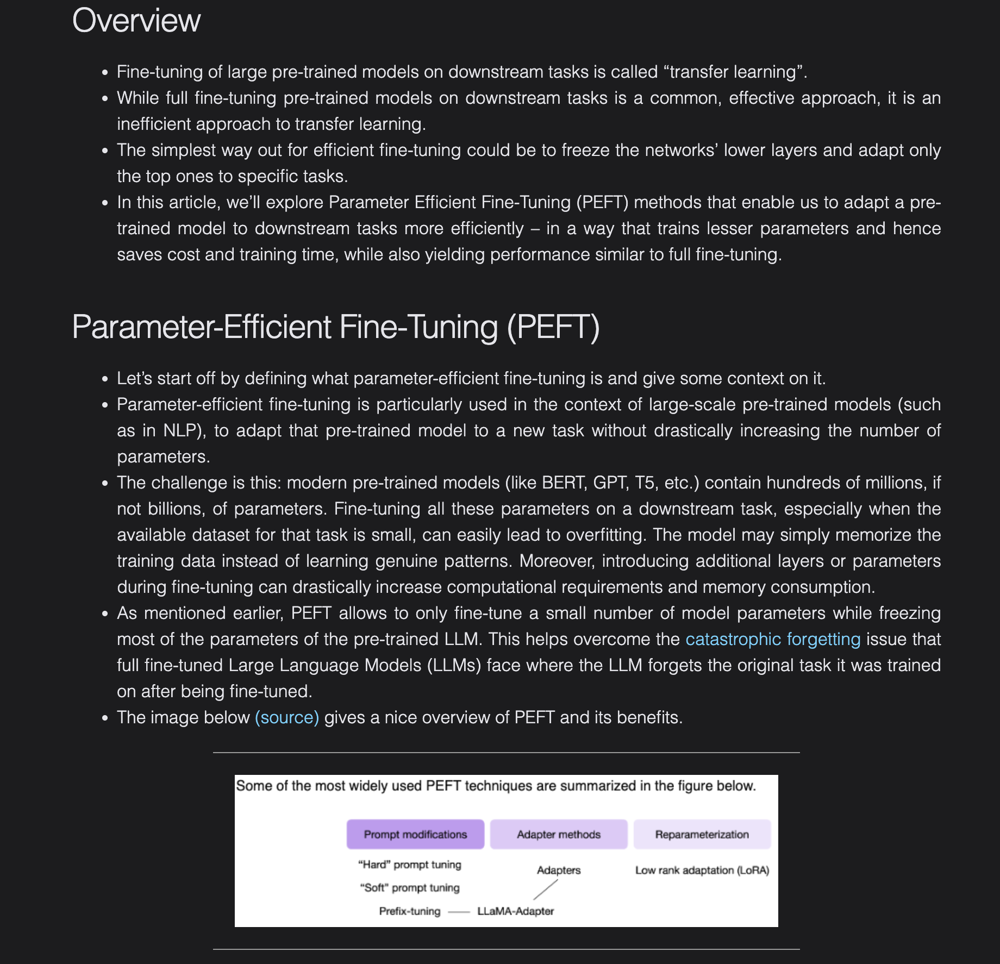

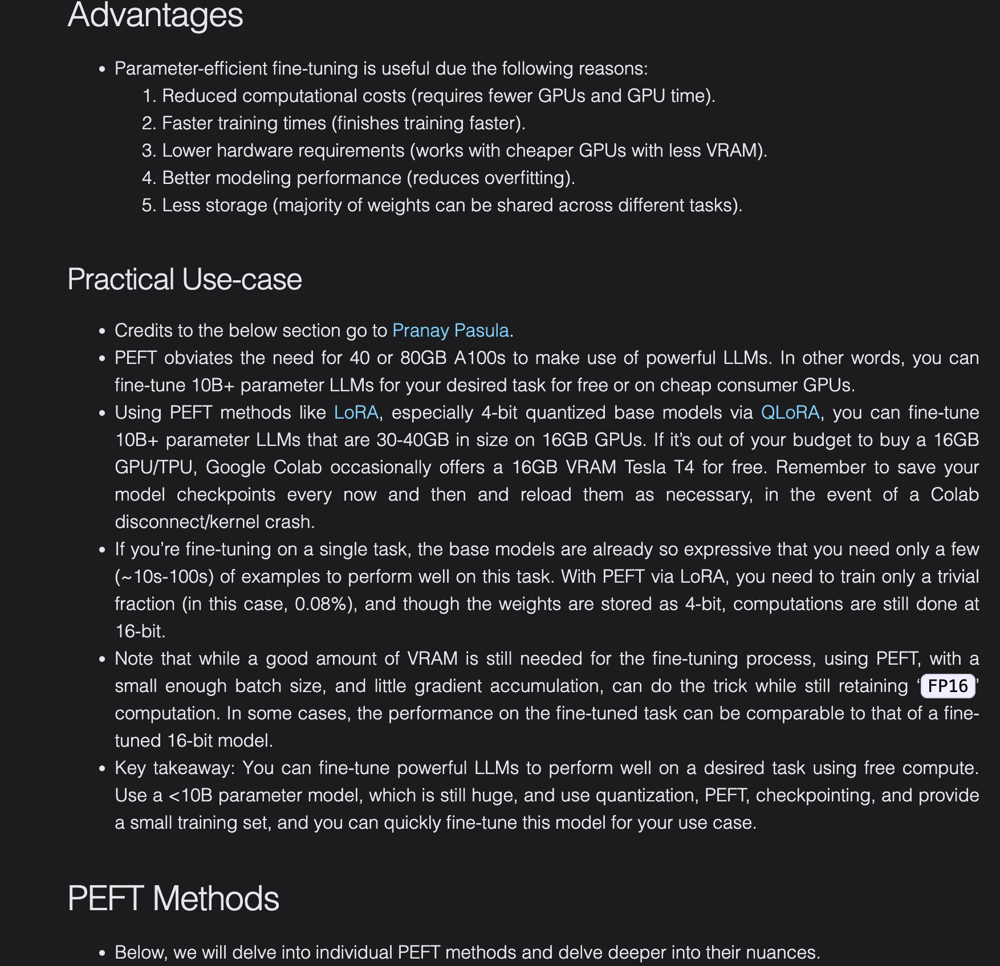

### Soft Prompt Tuning

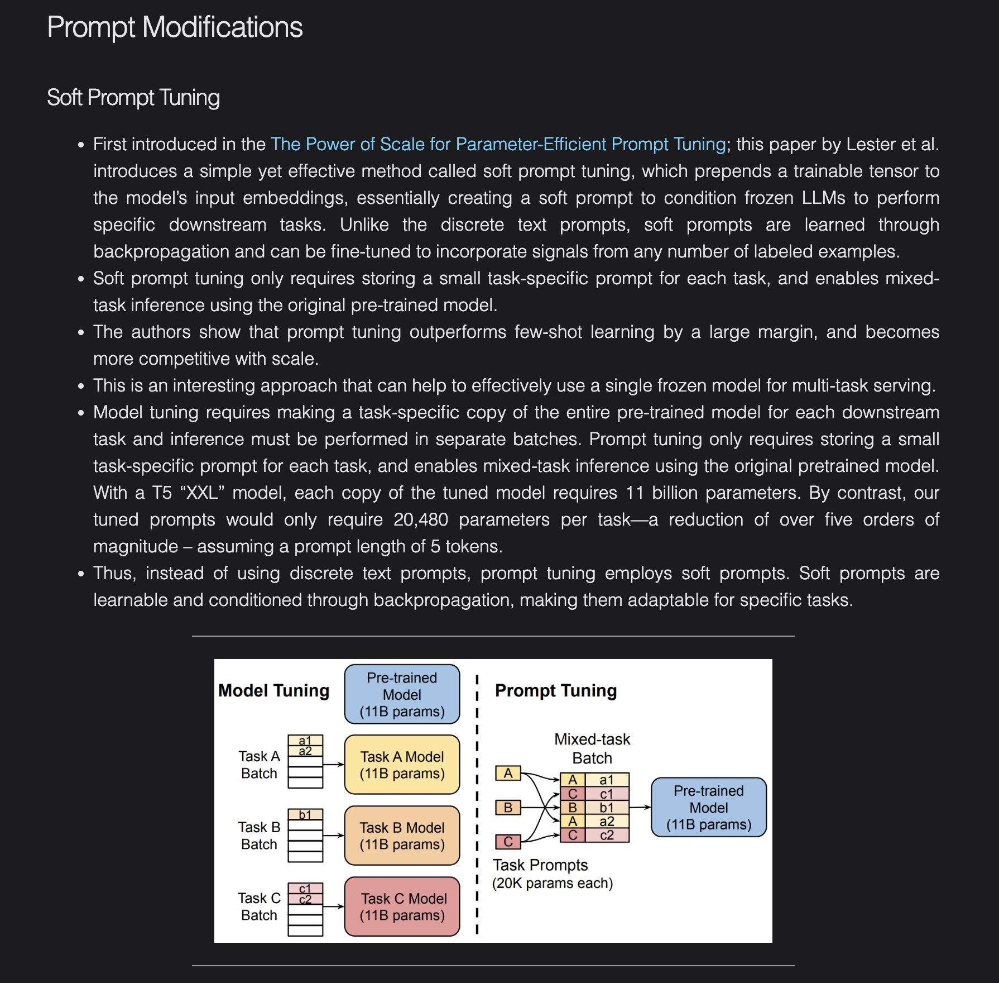

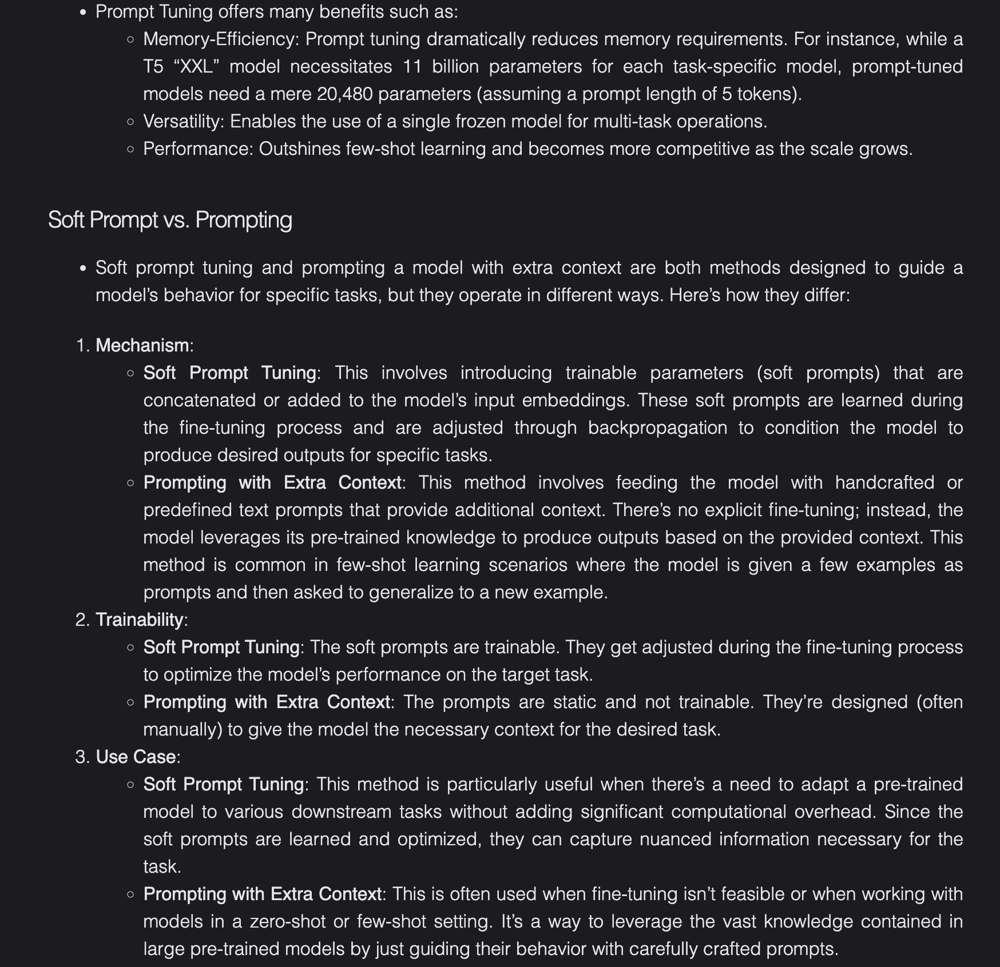

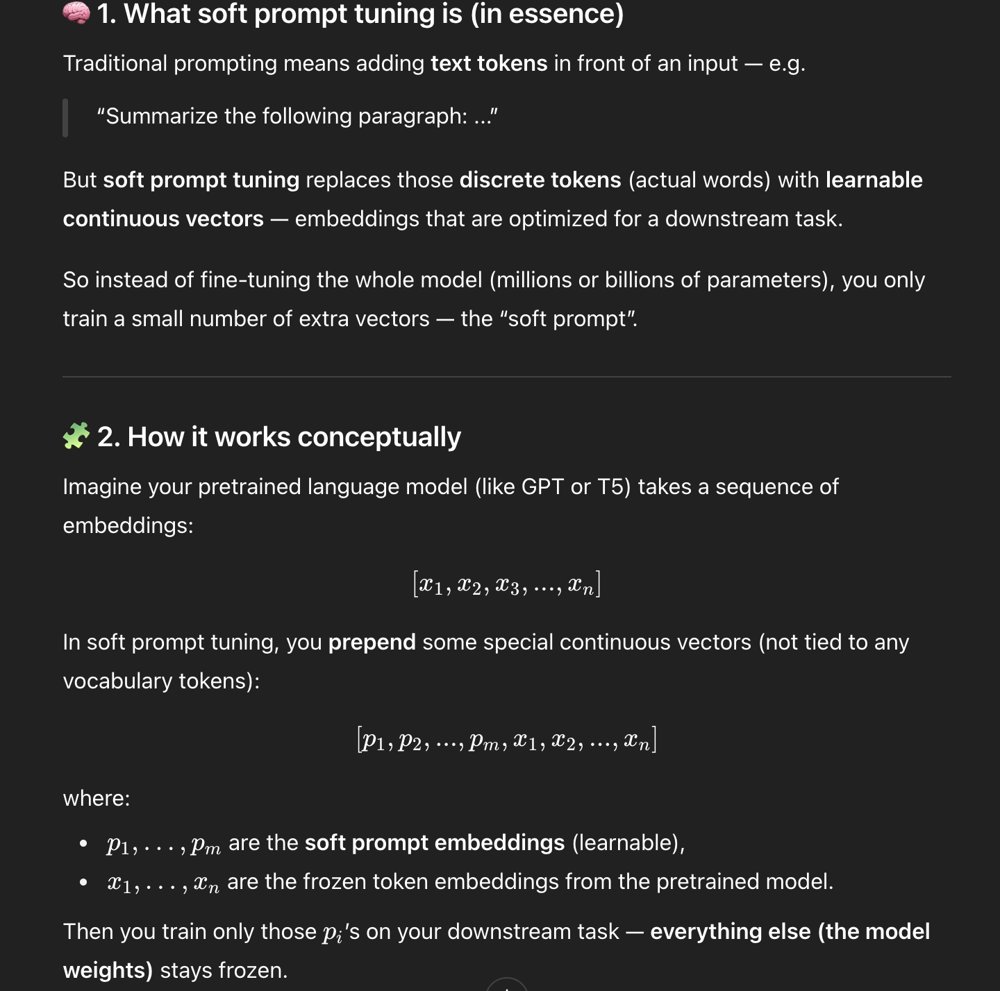

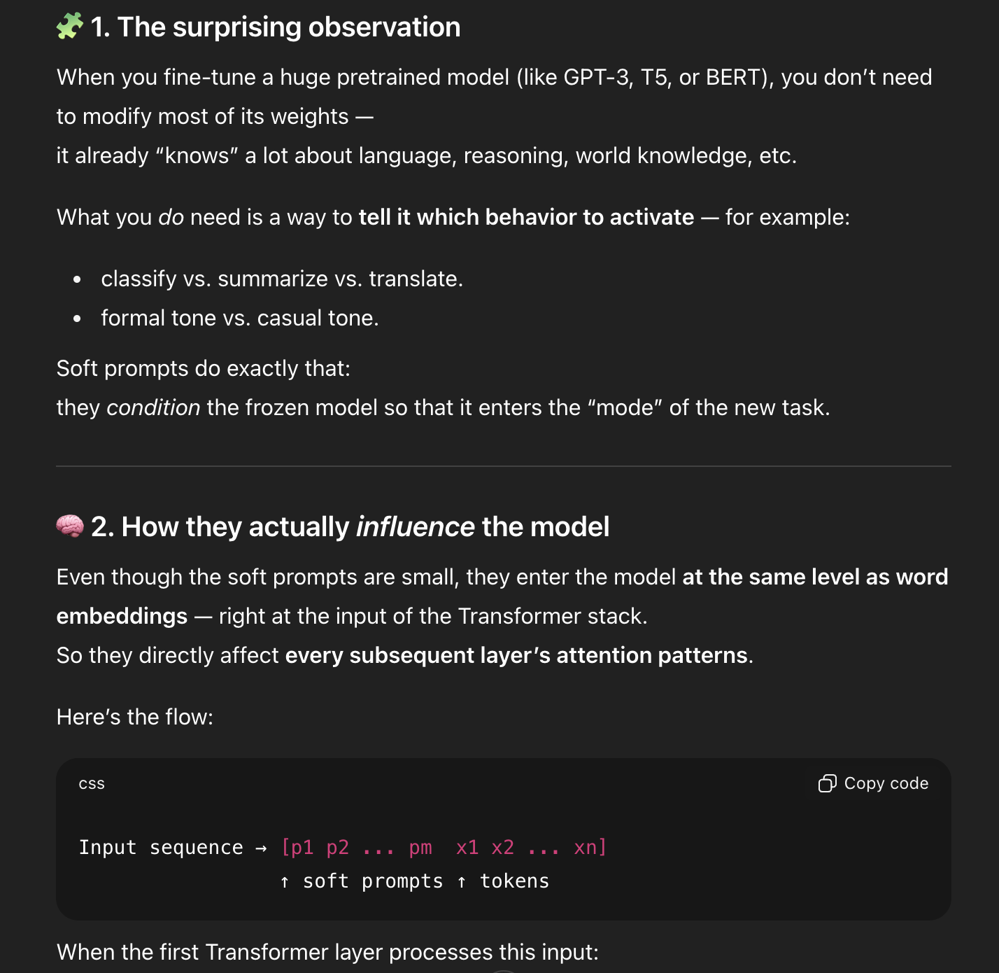

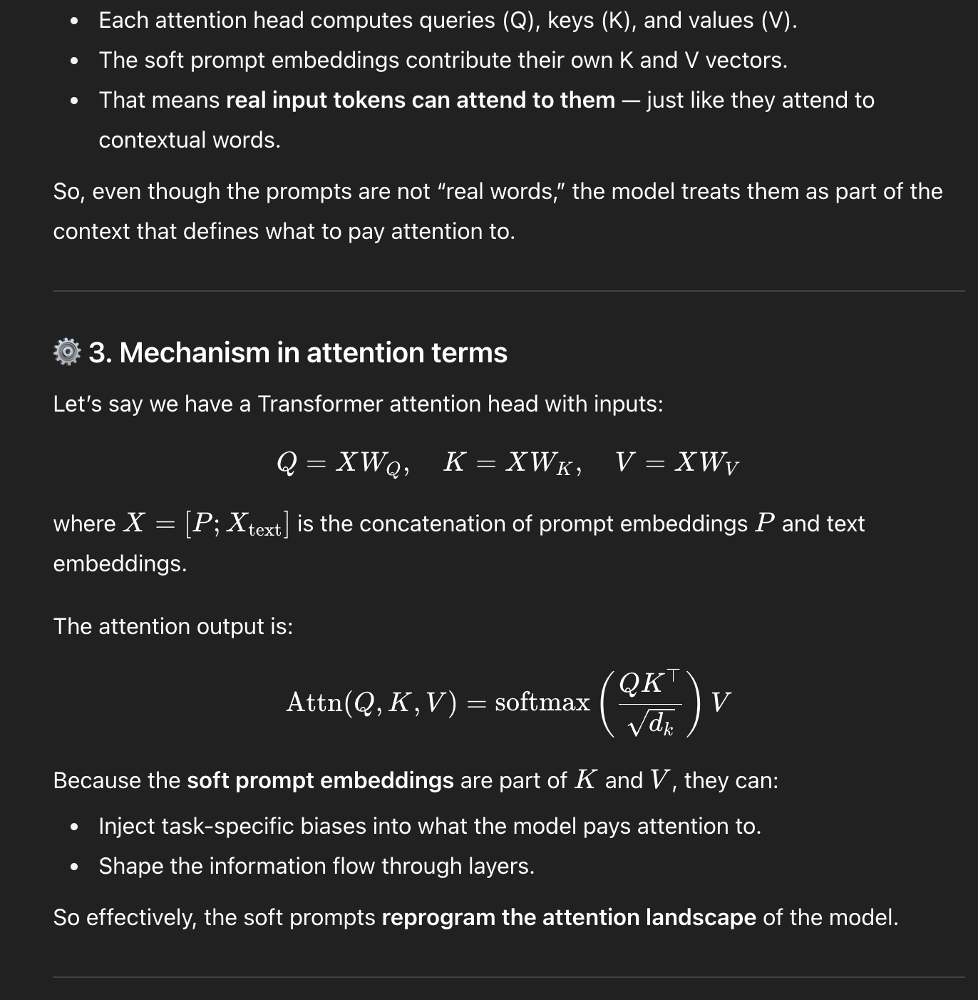

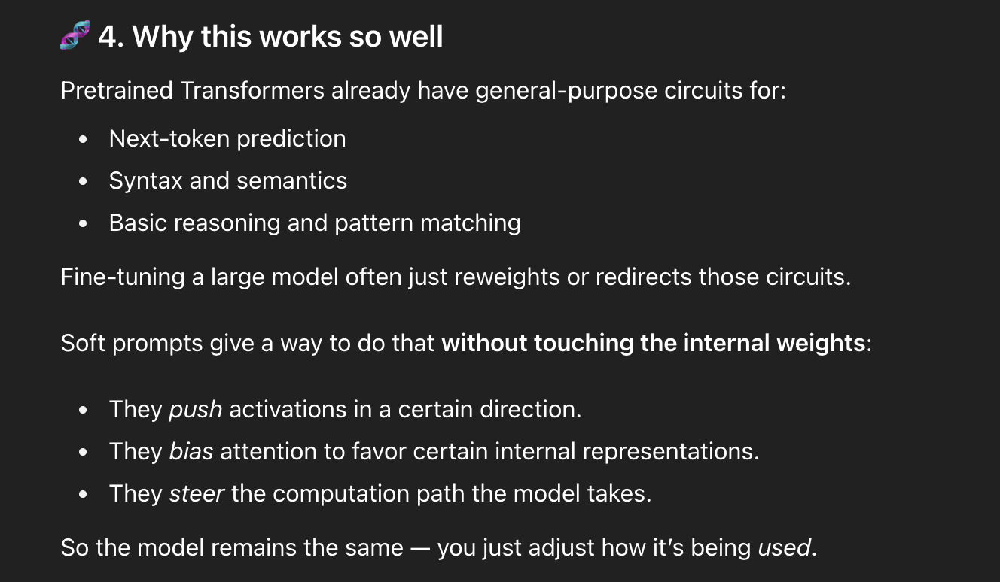

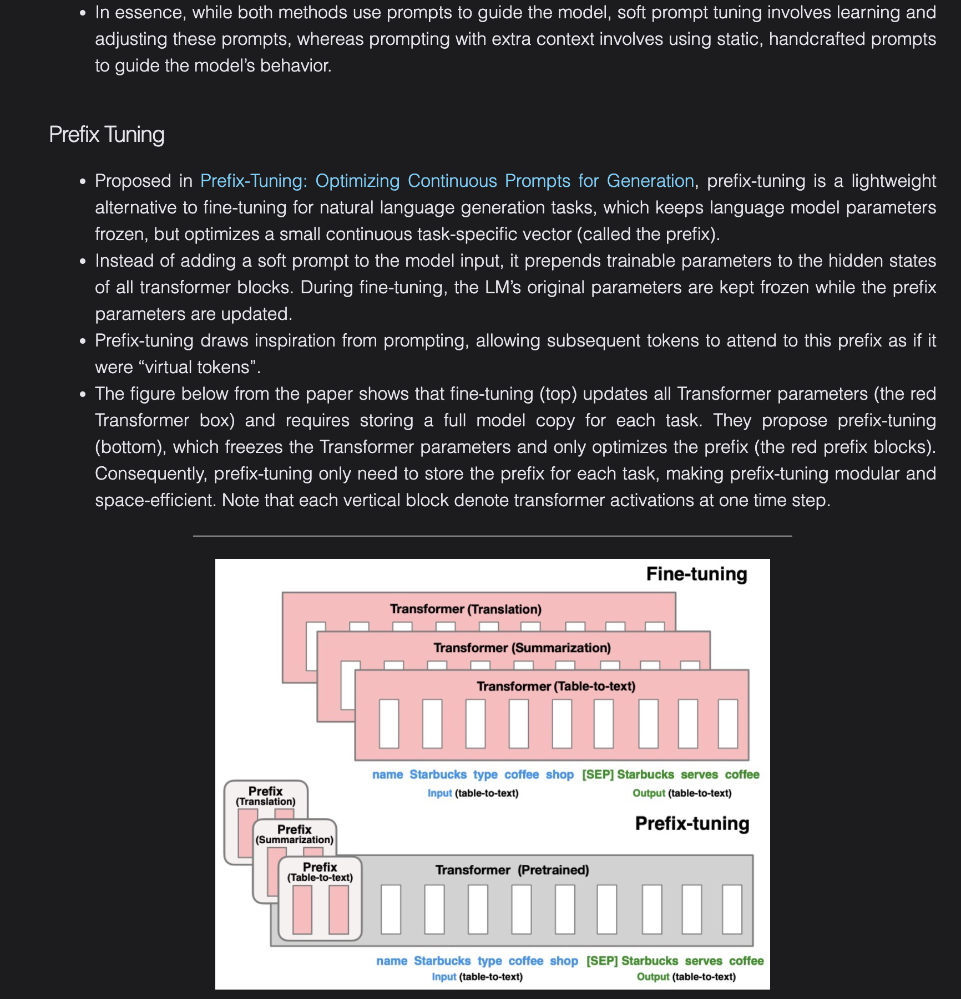

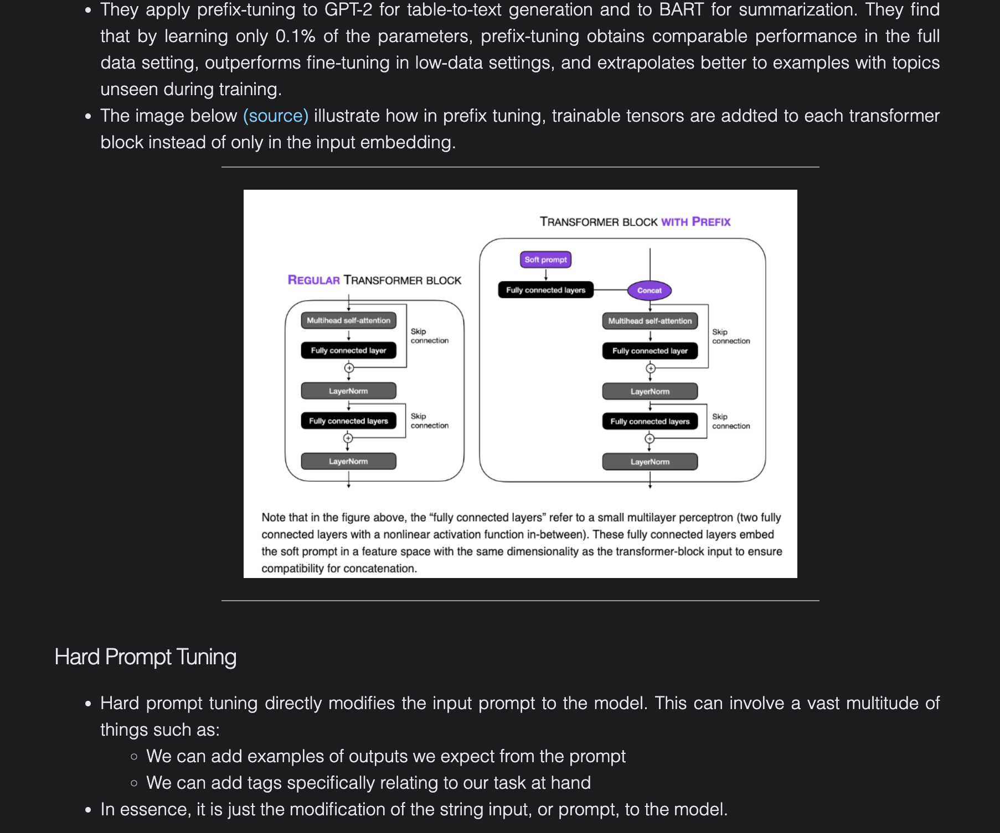

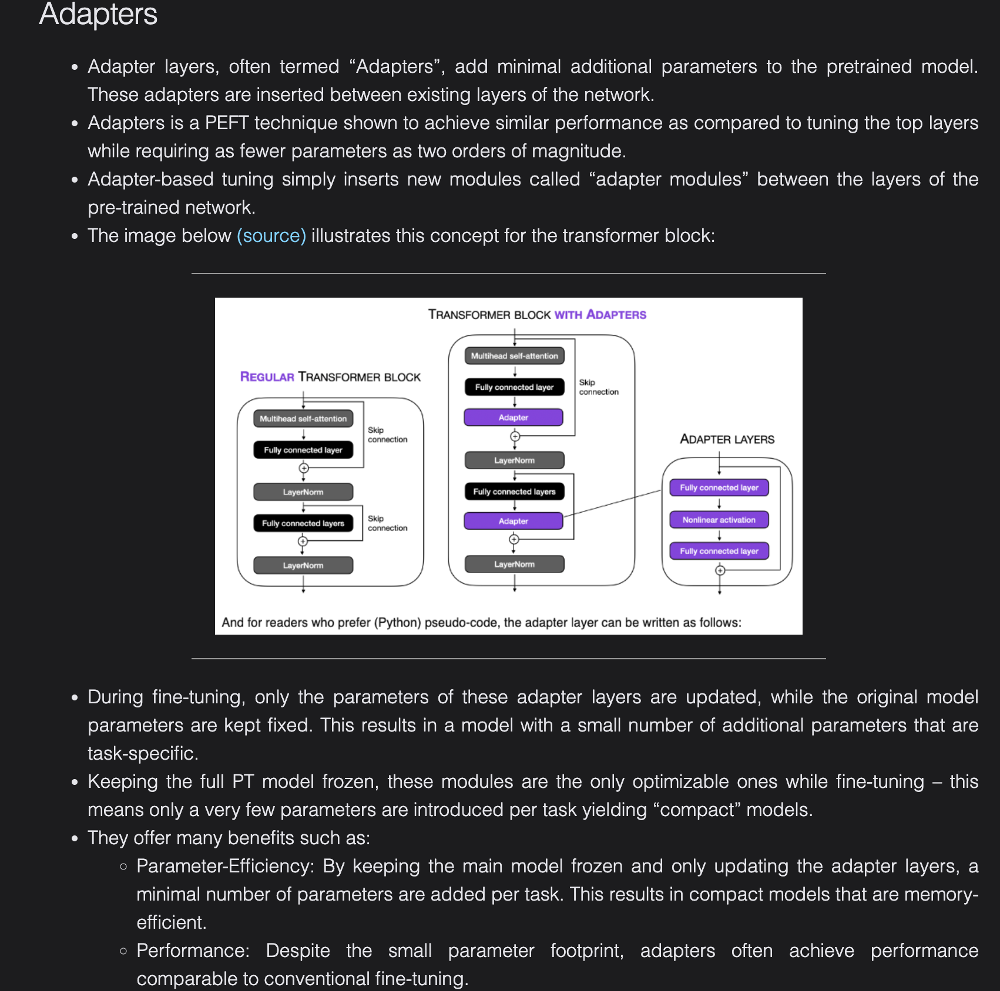

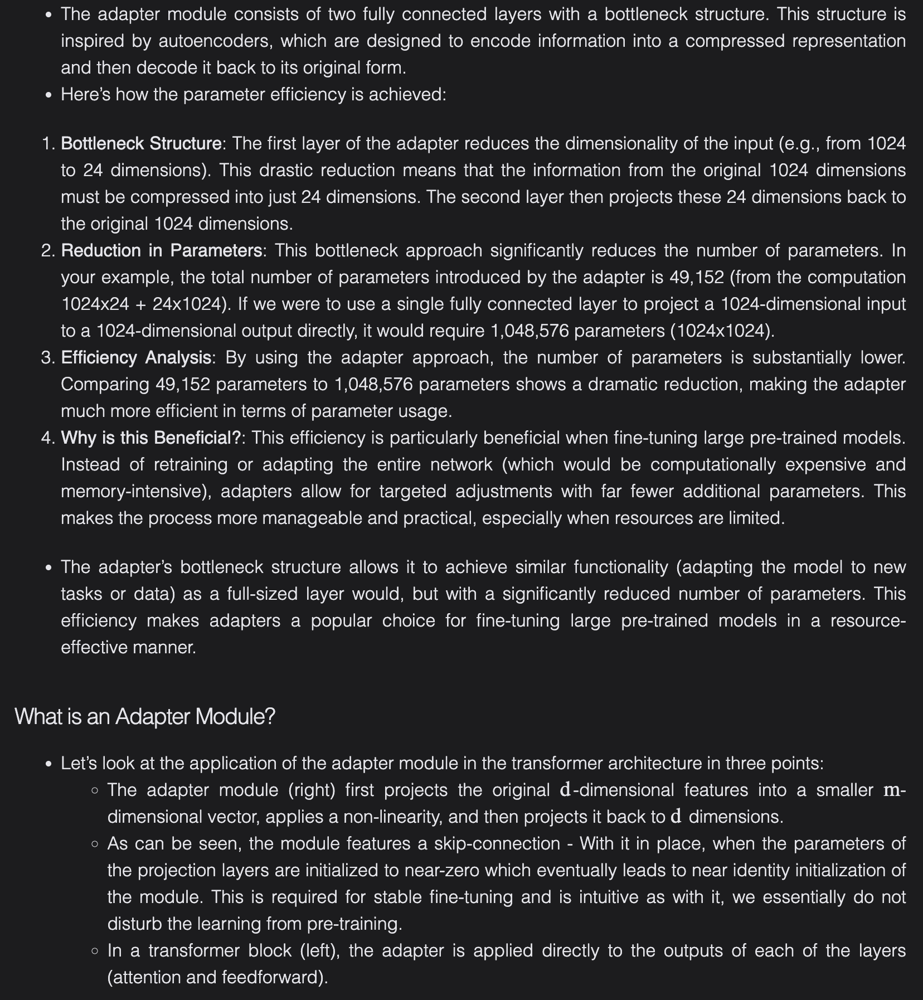



### LoRA on MNIST

In [1]:
import torch
import torchvision.datasets as datasets 
import torchvision.transforms as transforms
import torch.nn as nn
import matplotlib.pyplot as plt
from tqdm import tqdm


In [2]:
# Make torch deterministic
_ = torch.manual_seed(0)

In [3]:
# We will be training a network to classify MNIST digits and then fine-tune the network on a particular digit on which it doesn't perform well.

'''
Define a sequence of transformations to be applied to the images.
transforms.ToTensor() converts the image to a PyTorch tensor.
transforms.Normalize() normalizes the tensor with a given mean and standard deviation.
'''
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.1307, ), (0.3081, ))])

# Load the MNIST dataset
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
# Create a dataloader for the training
train_loader = torch.utils.data.DataLoader(mnist_trainset, batch_size=10, shuffle=True)

# Load the MNIST test set
mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=transform)
test_loader = torch.utils.data.DataLoader(mnist_testset, batch_size=10, shuffle=True)

# Define the device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


In [4]:
# Create the Neural Network to classify the digits, making it overly complicated to better show the power of LoRA

class RichBoyNet(nn.Module):

    def __init__(self, hidden_size_1=1000, hidden_size_2=2000):
        super(RichBoyNet, self).__init__()
        self.linear1 = nn.Linear(28*28, hidden_size_1)
        self.linear2 = nn.Linear(hidden_size_1, hidden_size_2)
        self.linear3 = nn.Linear(hidden_size_2, 10)
        self.relu = nn.ReLU()

    def forward(self, img):
        x = img.view(-1, 28*28)
        x = self.relu(self.linear1(x))
        x = self.relu(self.linear2(x))
        x = self.linear3(x)

        return x

net = RichBoyNet().to(device)

In [5]:
# Train the network only for 1 epoch to simulate a complete general pre-training on the data

def train(train_loader, net, epochs=5, total_iterations_limit=None):
    cross_el = nn.CrossEntropyLoss()

    optimizer = torch.optim.Adam(net.parameters(), lr=0.001)

    total_iterations = 0

    for epoch in range(epochs):
        net.train()

        loss_sum = 0
        num_iterations = 0

        data_iterator = tqdm(train_loader, desc=f'Epoch {epoch+1}')
        if total_iterations_limit is not None:
            data_iterator.total = total_iterations_limit

        for data in data_iterator:
            num_iterations += 1
            total_iterations += 1

            x, y = data
            x = x.to(device)
            y = y.to(device)

            optimizer.zero_grad()
            output = net(x.view(-1, 28*28))

            loss = cross_el(output, y)
            loss_sum += loss.item()

            avg_loss = loss_sum / num_iterations
            data_iterator.set_postfix(loss = avg_loss)

            loss.backward()
            optimizer.step()

            if total_iterations_limit is not None and total_iterations >= total_iterations_limit:
                return

train(train_loader, net, epochs=1)

Epoch 1: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6000/6000 [00:50<00:00, 118.41it/s, loss=0.237]


In [6]:
# Keep a copy of the original weights (cloning them) so later we can prove that a fine-tuning with LoRA doesn't alter the original weights

original_weights = {}

for name, param in net.named_parameters():
    original_weights[name] = param.clone().detach()

original_weights.keys()
original_weights

{'linear1.weight': tensor([[ 0.0273,  0.0467, -0.0018,  ...,  0.0495,  0.0313,  0.0296],
         [ 0.0161,  0.0209,  0.0254,  ...,  0.0156,  0.0299,  0.0059],
         [-0.0021,  0.0330, -0.0152,  ..., -0.0023,  0.0193,  0.0261],
         ...,
         [ 0.0107,  0.0743,  0.0726,  ...,  0.0415,  0.0677,  0.0151],
         [ 0.0562,  0.0195,  0.0052,  ...,  0.0395,  0.0331,  0.0339],
         [ 0.0122, -0.0115,  0.0397,  ...,  0.0491,  0.0225,  0.0329]]),
 'linear1.bias': tensor([-5.2162e-02, -1.4507e-02, -2.5700e-02, -2.7320e-02, -8.7417e-03,
         -4.8758e-02, -2.6138e-02, -8.9368e-03, -5.6065e-02, -7.2194e-03,
         -9.1339e-03, -1.5747e-02, -2.7861e-02, -3.0020e-02,  1.3044e-02,
         -2.6404e-02, -4.9694e-02, -3.8754e-02, -3.3025e-02, -5.4874e-02,
         -3.2971e-02, -5.4989e-02,  7.9940e-03, -5.4267e-02, -6.5913e-02,
         -4.8981e-02,  1.1720e-03, -2.0041e-02,  1.8407e-02, -3.7055e-02,
          2.4631e-03, -1.9250e-02, -2.4121e-02, -2.4028e-02, -3.0543e-02,
      

In [7]:
# The the performance of the pretrained network. As we can see, the network performs poorly on the digit 9. Let's fine-tune it on the digit 9

def test():
    correct = 0
    total = 0

    wrong_counts = [0 for i in range(10)]

    with torch.no_grad():
        for data in tqdm(test_loader, desc='Testing'):
            x, y = data
            x = x.to(device)
            y = y.to(device)
            output = net(x.view(-1, 784))
            for idx, i in enumerate(output):
                if torch.argmax(i) == y[idx]:
                    correct +=1
                else:
                    wrong_counts[y[idx]] +=1
                total +=1
    print(f'Accuracy: {round(correct/total, 3)}')
    for i in range(len(wrong_counts)):
        print(f'wrong counts for the digit {i}: {wrong_counts[i]}')

test()

Testing: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 831.18it/s]

Accuracy: 0.963
wrong counts for the digit 0: 13
wrong counts for the digit 1: 14
wrong counts for the digit 2: 27
wrong counts for the digit 3: 80
wrong counts for the digit 4: 16
wrong counts for the digit 5: 14
wrong counts for the digit 6: 57
wrong counts for the digit 7: 40
wrong counts for the digit 8: 23
wrong counts for the digit 9: 85


In [8]:
# Let's visualize how many parameters are in the original network, before introducing the LoRA matrices.

# Print the size of the weights matrices of the network
# Save the count of the total number of parameters
total_parameters_original = 0
for index, layer in enumerate([net.linear1, net.linear2, net.linear3]):
    total_parameters_original += layer.weight.nelement() + layer.bias.nelement()
    print(f'Layer {index+1}: W: {layer.weight.shape} + B: {layer.bias.shape}')
print(f'Total number of parameters: {total_parameters_original:,}')

Layer 1: W: torch.Size([1000, 784]) + B: torch.Size([1000])
Layer 2: W: torch.Size([2000, 1000]) + B: torch.Size([2000])
Layer 3: W: torch.Size([10, 2000]) + B: torch.Size([10])
Total number of parameters: 2,807,010


In [9]:
# Define the LoRA parameterization as described in the paper. The full detail on how PyTorch parameterizations work is here: https://pytorch.org/tutorials/intermediate/parametrizations.html


class LoRAParameterization(nn.Module):
    def __init__(self, features_in, features_out, rank = 1, alpha = 1, device='cpu'):
        super().__init__()
        # Section 4.1 of the paper: 
        #   We use a random Gaussian initialization for A and zero for B, so ∆W = BA is zero at the beginning of training
        self.lora_A = nn.Parameter(torch.zeros((rank,features_out)).to(device))
        self.lora_B = nn.Parameter(torch.zeros((features_in, rank)).to(device))
        nn.init.normal_(self.lora_A, mean=0, std=1)
        
        # Section 4.1 of the paper: 
        #   We then scale ∆Wx by α/r , where α is a constant in r. 
        #   When optimizing with Adam, tuning α is roughly the same as tuning the learning rate if we scale the initialization appropriately. 
        #   As a result, we simply set α to the first r we try and do not tune it. 
        #   This scaling helps to reduce the need to retune hyperparameters when we vary r.
        self.scale = alpha / rank
        self.enabled = True

        assert self.lora_A.shape == (rank, features_out)
        assert self.lora_B.shape == (features_in, rank)

    def forward(self, original_weights):
        if self.enabled:
            # Return W + (B*A)*scale
            return original_weights + torch.matmul(self.lora_B, self.lora_A).view(original_weights.shape) * self.scale
        else:
            return original_weights
    

In [10]:
# Add the parameterization to our network

import torch.nn.utils.parametrize as parametrize

def linear_layer_parameterization(layer, device, rank=1, lora_alpha=1):
    # Only add the parameterization to the weight matrix, ignore the Bias

    # From section 4.2 of the paper:
    #   We limit our study to only adapting the attention weights for downstream tasks and freeze the MLP modules (so they are not trained in downstream tasks) both for simplicity and parameter-efficiency.
    #   [...]
    #   We leave the empirical investigation of [...], and biases to a future work.
    
    features_out, features_in = layer.weight.shape
    return LoRAParameterization(
        features_in, features_out, rank=rank, alpha=lora_alpha, device=device
    )

parametrize.register_parametrization(
    net.linear1, "weight", linear_layer_parameterization(net.linear1, device)
)
parametrize.register_parametrization(
    net.linear2, "weight", linear_layer_parameterization(net.linear2, device)
)
parametrize.register_parametrization(
    net.linear3, "weight", linear_layer_parameterization(net.linear3, device)
)

print("linear1 parametrizations:", len(net.linear1.parametrizations["weight"]))
print("linear2 parametrizations:", len(net.linear2.parametrizations["weight"]))
print("linear3 parametrizations:", len(net.linear3.parametrizations["weight"]))


def enable_disable_lora(enabled=True):
    for layer in [net.linear1, net.linear2, net.linear3]:
        layer.parametrizations["weight"][0].enabled = enabled

linear1 parametrizations: 1
linear2 parametrizations: 1
linear3 parametrizations: 1


In [11]:
total_parameters_lora = 0
total_parameters_non_lora = 0
for index, layer in enumerate([net.linear1, net.linear2, net.linear3]):
    total_parameters_lora += layer.parametrizations["weight"][0].lora_A.nelement() + layer.parametrizations["weight"][0].lora_B.nelement()
    total_parameters_non_lora += layer.weight.nelement() + layer.bias.nelement()
    print(
        f'Layer {index+1}: W: {layer.weight.shape} + B: {layer.bias.shape} + Lora_A: {layer.parametrizations["weight"][0].lora_A.shape} + Lora_B: {layer.parametrizations["weight"][0].lora_B.shape}'
    )
# The non-LoRA parameters count must match the original network
assert total_parameters_non_lora == total_parameters_original
print(f'Total number of parameters (original): {total_parameters_non_lora:,}')
print(f'Total number of parameters (original + LoRA): {total_parameters_lora + total_parameters_non_lora:,}')
print(f'Parameters introduced by LoRA: {total_parameters_lora:,}')
parameters_incremment = (total_parameters_lora / total_parameters_non_lora) * 100
print(f'Parameters incremment: {parameters_incremment:.3f}%')

Layer 1: W: torch.Size([1000, 784]) + B: torch.Size([1000]) + Lora_A: torch.Size([1, 1000]) + Lora_B: torch.Size([784, 1])
Layer 2: W: torch.Size([2000, 1000]) + B: torch.Size([2000]) + Lora_A: torch.Size([1, 2000]) + Lora_B: torch.Size([1000, 1])
Layer 3: W: torch.Size([10, 2000]) + B: torch.Size([10]) + Lora_A: torch.Size([1, 10]) + Lora_B: torch.Size([2000, 1])
Total number of parameters (original): 2,807,010
Total number of parameters (original + LoRA): 2,813,804
Parameters introduced by LoRA: 6,794
Parameters incremment: 0.242%


In [12]:
# Freeze the non-Lora parameters
for name, param in net.named_parameters():
    if 'lora' not in name:
        print(f'Freezing non-LoRA parameter {name}')
        param.requires_grad = False

# Load the MNIST dataset again, by keeping only the digit 9
mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
is_nine = (mnist_trainset.targets == 9)
mnist_trainset.data    = mnist_trainset.data[is_nine]
mnist_trainset.targets = mnist_trainset.targets[is_nine]
# Create a dataloader for the training
train_loader = torch.utils.data.DataLoader(mnist_trainset, batch_size=10, shuffle=True)

# Train the network with LoRA only on the digit 9 and only for 100 batches (hoping that it would improve the performance on the digit 9)
train(train_loader, net, epochs=1, total_iterations_limit=100)

Freezing non-LoRA parameter linear1.bias
Freezing non-LoRA parameter linear1.parametrizations.weight.original
Freezing non-LoRA parameter linear2.bias
Freezing non-LoRA parameter linear2.parametrizations.weight.original
Freezing non-LoRA parameter linear3.bias
Freezing non-LoRA parameter linear3.parametrizations.weight.original


Epoch 1:  99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 99/100 [00:00<00:00, 103.28it/s, loss=0.0489]


In [13]:
# Check that the frozen parameters are still unchanged by the finetuning
assert torch.all(net.linear1.parametrizations.weight.original == original_weights['linear1.weight'])
assert torch.all(net.linear2.parametrizations.weight.original == original_weights['linear2.weight'])
assert torch.all(net.linear3.parametrizations.weight.original == original_weights['linear3.weight'])

enable_disable_lora(enabled=True)
# The new linear1.weight is obtained by the "forward" function of our LoRA parametrization
# The original weights have been moved to net.linear1.parametrizations.weight.original
# More info here: https://pytorch.org/tutorials/intermediate/parametrizations.html#inspecting-a-parametrized-module
P = net.linear1.parametrizations.weight[0]                 # the LoRA parametrization module
W0 = net.linear1.parametrizations.weight.original          # original (frozen) weight, shape [out, in]
BA = (P.lora_B @ P.lora_A)                                 # [out, in]
delta = BA.view_as(W0) * P.scale                           # match the forward’s view/scale
W_effective_manual = (W0 + delta).to(dtype=net.linear1.weight.dtype, device=net.linear1.weight.device)

# Use allclose, not equal (set tight tolerances if you like)
assert torch.allclose(net.linear1.weight, W_effective_manual, rtol=1e-6, atol=1e-7), \
    "Effective weight != W0 + (B@A)*scale within tolerance"

enable_disable_lora(enabled=False)
# If we disable LoRA, the linear1.weight is the original one
assert torch.equal(net.linear1.weight, original_weights['linear1.weight'])

In [14]:
# Test with LoRA enabled
enable_disable_lora(enabled=True)
test()

Testing: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:05<00:00, 191.63it/s]

Accuracy: 0.903
wrong counts for the digit 0: 154
wrong counts for the digit 1: 26
wrong counts for the digit 2: 34
wrong counts for the digit 3: 209
wrong counts for the digit 4: 120
wrong counts for the digit 5: 69
wrong counts for the digit 6: 67
wrong counts for the digit 7: 170
wrong counts for the digit 8: 114
wrong counts for the digit 9: 7


In [15]:
# Test with LoRA disabled
enable_disable_lora(enabled=False)
test()

Testing: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:01<00:00, 784.15it/s]

Accuracy: 0.963
wrong counts for the digit 0: 13
wrong counts for the digit 1: 14
wrong counts for the digit 2: 27
wrong counts for the digit 3: 80
wrong counts for the digit 4: 16
wrong counts for the digit 5: 14
wrong counts for the digit 6: 57
wrong counts for the digit 7: 40
wrong counts for the digit 8: 23
wrong counts for the digit 9: 85


### REFERENCES:

- https://sebastianraschka.com/blog/2023/llm-finetuning-lora.html
- https://aman.ai/primers/ai/parameter-efficient-fine-tuning/
